# 计算电池大小与太阳能板的关系

## 通过估算每天的电能消耗，并与太阳能板的发电效率模拟出最低电池容量大小和充电速率

author: 李树雨<br>time: 2021.11.6

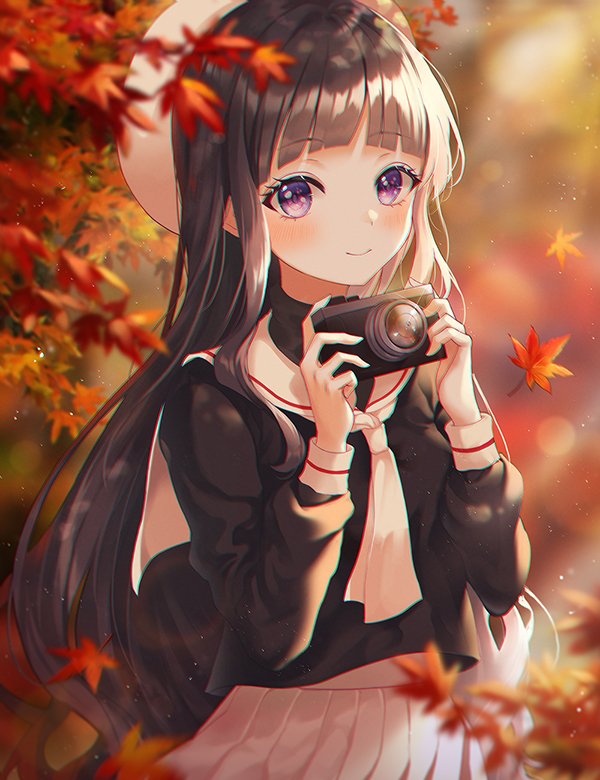

In [1]:
from battery import battery
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
#global config
max_recharge_rate = 7000 # 最大充电速率7kw
max_solar_generation_rate = 20000 # 最大太阳能发20kwh
# batteries = [battery(max_recharge_rate, 100000, 0.96)]
base = "/Users/lishuyu/PycharmProjects/solarPowerEstimate/"
npy = f"{base}npy/"
plot = f"{base}plot/"

In [3]:
solarrad = np.load(npy+"solarrad.npy")
spring24 = np.load(npy+"spring24.npy")

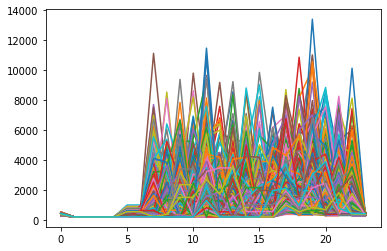

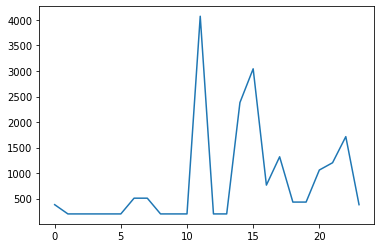

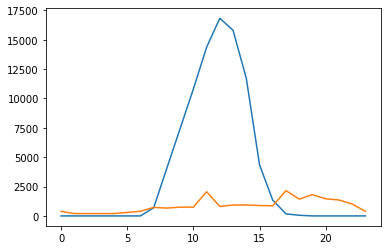

In [4]:
plt.plot(spring24.T)
plt.show()
plt.plot(spring24[0])
plt.show()
plt.plot(solarrad[:24]*1000)
spring24 = np.sum(spring24, axis=0)/1000
plt.plot(spring24); plt.show()

In [5]:
"""for day in range(len(solarrad)//24):
    for hour in range(24):
        charge = solarrad[day*24+hour] * 1000
        discharge = spring24[hour]
        # print(charge, discharge)
        if charge > discharge:
            remain = charge - discharge
            for bat in batteries:
                remain = bat.charge(remain)
        elif charge < discharge:
            pull = discharge - charge
            for bat in batteries:
                pull = bat.discharge(pull)
            if pull > 0:
                print(f"No avaliable energy on day:{day} hour:{hour}")
        else:
            print("balance")"""

'for day in range(len(solarrad)//24):\n    for hour in range(24):\n        charge = solarrad[day*24+hour] * 1000\n        discharge = spring24[hour]\n        # print(charge, discharge)\n        if charge > discharge:\n            remain = charge - discharge\n            for bat in batteries:\n                remain = bat.charge(remain)\n        elif charge < discharge:\n            pull = discharge - charge\n            for bat in batteries:\n                pull = bat.discharge(pull)\n            if pull > 0:\n                print(f"No avaliable energy on day:{day} hour:{hour}")\n        else:\n            print("balance")'

In [25]:
def main(max_nopower_count):
    power_recharge_rate = 8000
    #battery.battery()
    #max_nopower_count = 1
    for decline in range(20, 0, -1):
        status = True
        current_cap = []
        batteries = [battery(power_recharge_rate, decline, 0.96)]
        for day in range(len(solarrad)//24):
            print("-", end="")
            for hour in range(24):
                charge = solarrad[day*24+hour] * 1000
                discharge = spring24[hour]
                # print(charge, discharge)
                if charge > discharge:
                    if not status:
                        print(f"reset status charge > discharge {charge, discharge}")
                        status = True
                    remain = charge - discharge
                    for bat in batteries:
                        remain = bat.charge(remain, log=False)
                elif charge < discharge:
                    print(sum([i.capacity for i in batteries]))
                    pull = discharge - charge
                    for bat in batteries:
                        pull = bat.discharge(pull, log=True)
                    if pull > 0.0001:
                        print(charge, discharge, sum_cap, "note: battery is later for one")
                        print(f"No avaliable energy on day:{day} hour:{hour}")
                        if status:
                            max_nopower_count-=1
                            print("count_decrease, set status to false")
                            status = False
                        if max_nopower_count == 0:
                            print("Break as count == 0")
                            break
                else:
                    print("balance")
                sum_cap = 0
                for bat in batteries:
                    sum_cap += bat.capacity
                current_cap.append(sum_cap)
            if max_nopower_count == 0:
                break
        if max_nopower_count == 0:
            break
        print("decline at :"+str(decline))
    sum_cap = 0
    for bat in batteries:
        sum_cap += bat.capacity
    current_cap.append(sum_cap)
    plt.plot(current_cap[-24:], label="battery")
    plt.plot(solarrad[day*24+hour-22:day*24+hour+2]*1000, label="produce")
    new_list = list(spring24)
    new_list.extend(new_list)
    plt.plot(new_list[hour+1:hour+25], label="consume")
    plt.legend(loc="upper left")
    plt.grid()
    plt.savefig(f"{plot}lastElectric_decline{decline}_max_nopower_count{max_nopower_count}.png")
    plt.show()

Battery set complied: max_capactity = 20
max_recharge_rate:8000
-20
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
20
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 2.2737367544323206e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rat

0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
20
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate <

-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
20
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
20
1.0901251059301345
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max

0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
20
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate <

0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
20
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
20
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
20
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < d

-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
19
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
19
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
19
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.m

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max

-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
19
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.

0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
19
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.

19
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 

0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
18
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.

-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
18
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate <

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
18
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.ma

-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
18
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate <

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
18
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
18
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < di

0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
17
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
17
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.ma

17
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.

0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
17
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.

0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
17
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.

17
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
16
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: -2.842170943040401e-14
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.ma

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
16
self.ma

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
16
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.ma

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
16
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.ma

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
16
self.ma

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
16
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.ma

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
15
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.ma

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
15
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.ma

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
15
self.ma

0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.m

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
15
self.ma

0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
15
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.

14
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 2.2737367544323206e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
14
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.ma

0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
14
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.

0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < 

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: -5.684341886080802e-14
14
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 rem

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
14
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.ma

0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
14
self.

0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
13
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.

0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
13
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
13
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
13
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.m

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
13
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < di

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
13
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.ma

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
13
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 re

0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
12
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.

-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
12
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.

0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
12
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.

-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
12
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate <

0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
12
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
12
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
12
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.m

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
11
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < di

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
11
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.ma

0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
11
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
11
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.ma

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
11
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.ma

0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
11
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.136868377

0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: -2.842170943040401e-14
10
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
10
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.ma

0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
10
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.m

10
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
10
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
9
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_

0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
9
self.m

0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
9
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.m

0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
9
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.m

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
9
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max

0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
9
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.m

-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
8
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.m

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
8
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max

-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
8
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.m

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
8
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
8
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
8
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < dis

-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
8
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < 

0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
8
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.m

0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
7
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.m

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
7
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max

-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
7
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
7
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
7
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
7
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < dis

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
6
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max

0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
6
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.m

0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
6
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.m

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
6
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max

6
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
6
self.m

0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
6
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.m

0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
5
self.m

0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
5
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.m

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
5
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: -5.684341886080802e-14
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 rem

0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.m

0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
5
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: -1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
4
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: -3.552713678800501e-15
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
4
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 rem

4
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.m

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
4
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max

0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
4
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.m

-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
4
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.m

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
3
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < di

3
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.m

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
3
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max

0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
3
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.m

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
3
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
3
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < di

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
3
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max

0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.m

-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
2
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.m

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
2
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max

0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
2
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.m

-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
2
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < 

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max

0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.m

0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
1
self.m

0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
1
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.m

0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
1
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.m

self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
1
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < di

0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
1
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.m

0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
1
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 1.1368683772161603e-13
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
-0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.max_recharge_rate < discharge_target_real <= self.capacity: 	 remain: 0.0
0
self.m

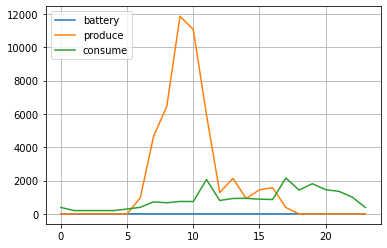

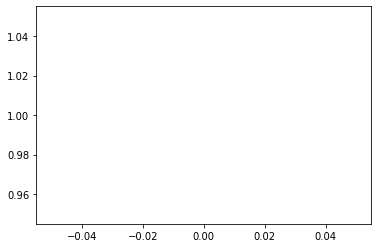

In [26]:
cap = []
for i in range(10,11):
    cap.append(main(i))
plt.plot(cap)
plt.savefig(f"{plot}relationshipBetweenNopowerCountAndCap.png")

333